___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 3<br><br>Regression with ANN (Dummy Version for Month)<br><br>KC House Data<br><h1>

# Keras Regression

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [2]:
#!pip install folium 

# Koordinatlar üzerine haritayı plotlamayı sağlayacak. Yani görselleştirme imkanı sağlayacak.

In [ ]:
#from google.colab import drive

#drive.mount('/content/drive')

In [ ]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [ ]:
#from matplotlib import style
#style.use('dark_background')

In [3]:
df = pd.read_csv("kc_house_data.csv")

## Exploratory Data Analysis and Visualization

In [4]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [6]:
df.isnull().sum().any()

False

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


Yukarıdaki describe kısmını inceledikten sonra bazı featureların max değerlerinin yüksek olduğunu görüyoruz. Bunları teker teker incelemek gerekir. 

### İd_number

In [8]:
df = df.drop('id', axis = 1)

### price

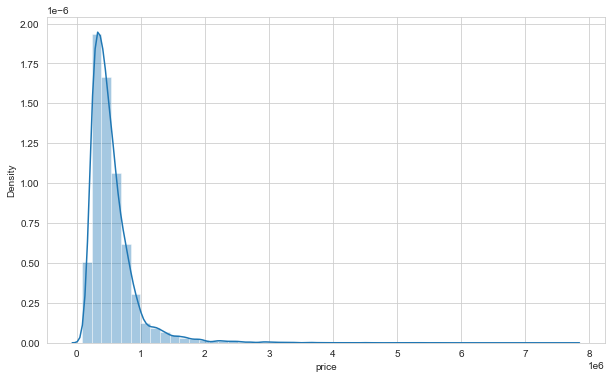

In [9]:
sns.distplot(df['price']);

3 milyondan büyük evlerin bilgilerini tekrar inceliyorum. Özellikleri ile fiyatları karşılaştırdığımda sorun olan bir gözlem görmedik.

In [10]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [11]:
df.groupby("waterfront").mean().T  

# Evin deniz manzaralı olup olmaması durumuna baktım.

waterfront,0,1
price,531762.324,1662524.184
bedrooms,3.374,3.301
bathrooms,2.112,2.678
sqft_living,2072.007,3173.687
sqft_lot,15021.290,25371.828
floors,1.493,1.641
view,0.207,3.767
condition,3.409,3.534
grade,7.649,8.773
sqft_above,1783.392,2473.043


Target labelim olan price feature en çok etkileyen featureları görmek için corr. baktığımızda en fazla etkisi olan feature sqft_living olarak görülüyor.

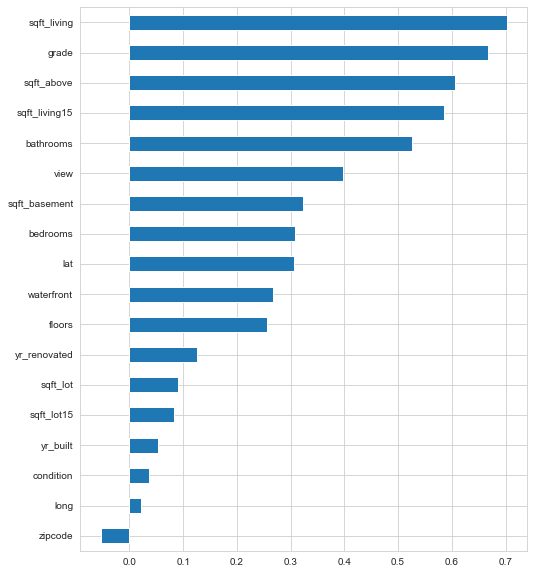

In [12]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

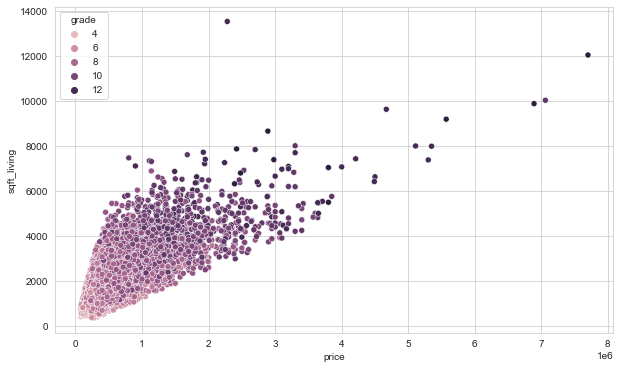

In [14]:
sns.scatterplot(x = 'price', y = 'sqft_living', data = df, hue = "grade");

### bedrooms

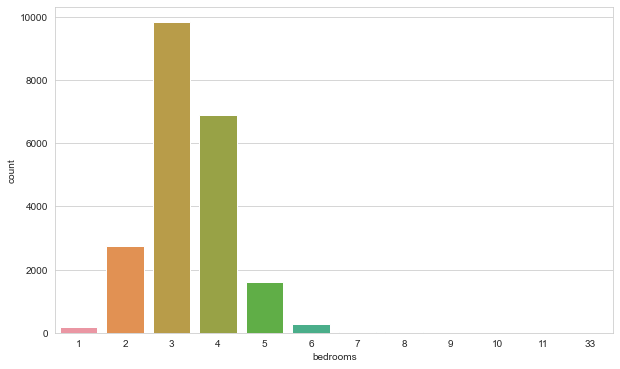

In [15]:
sns.countplot(df['bedrooms']);

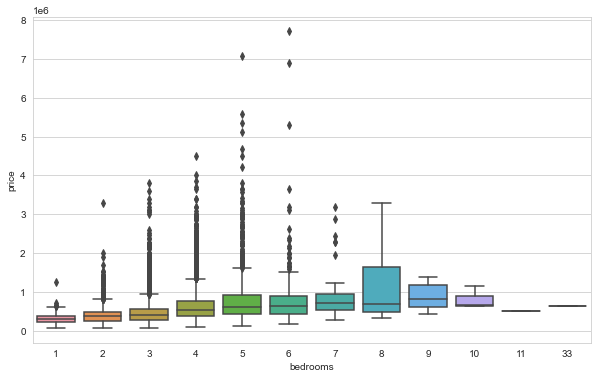

In [16]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

11 ve 33 odalı evlerin fiyatlarının çok düşük olduğunu gördük. Bunların durumlarına m2 ve banyo sayısına bakınca bunların yanlış olarak girilmiş olabileceğini değerlendirerek bunları drop ediyorum.

In [17]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [18]:
df = df[df["bedrooms"] != 33]  

Most likely the data was entered incorrectly.

In [19]:
df.shape

(21596, 20)

### date

In [20]:
df['date'].dtype

dtype('O')

In [21]:
df['date'] = pd.to_datetime(df['date'])

In [22]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [23]:
df['year'] = df['date'].dt.year

#df['year'] = df['date'].apply(lambda date : date.year)

In [24]:
df['month'] = df['date'].dt.month

In [25]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


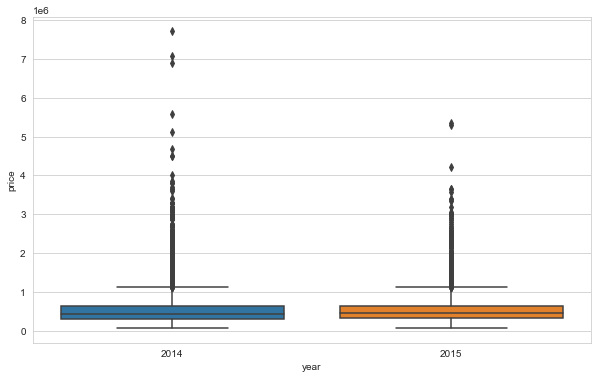

In [26]:
sns.boxplot(x = 'year', y = 'price', data = df);

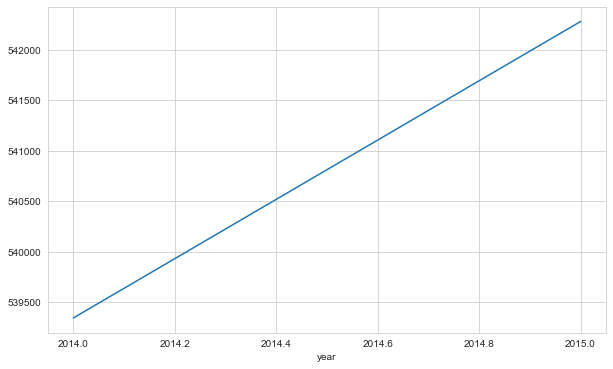

In [27]:
df.groupby('year')['price'].mean().plot();

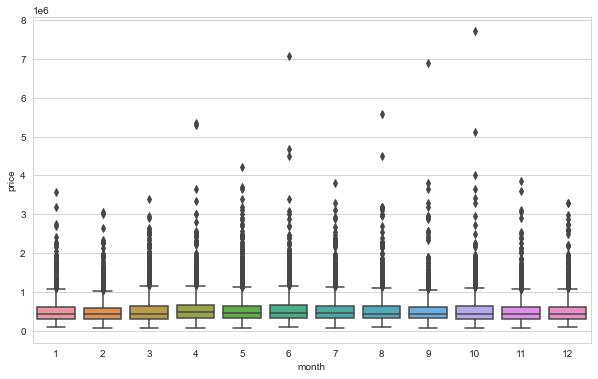

In [28]:
sns.boxplot(x = 'month', y = 'price', data = df);

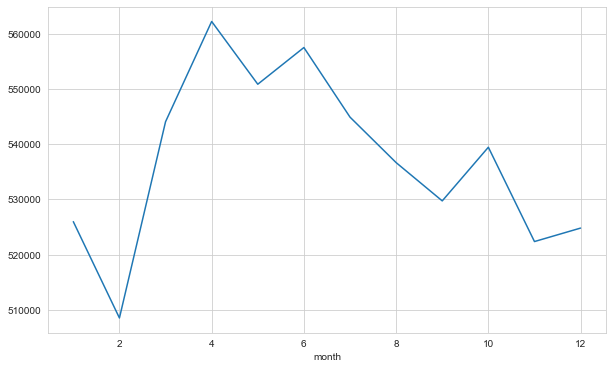

In [29]:
df.groupby('month')['price'].mean().plot();

lineplot ile bakınca aylık olarak yaz dönemlerinde evlerin fiyatlarının arttığını görüyoruz.

Burada monthları ayrı olarak tutmak yerine Month ların birbirine karşı bir üstünlüğü olmadığından dolayı bunları get dummy yapıyoruz. Bunlar nominal kategorik veriler yani ordinal kategorik veri değiller.

In [30]:
month_dummy = pd.get_dummies(df["month"], prefix = "month")
df = pd.concat([df, month_dummy], axis = 1)
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [31]:
df = df.drop(['date', "year", "month"], axis = 1)

### zipcode

In [32]:
df['zipcode'].value_counts(dropna = False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

Zipcode ile ilgili domain bilgimiz yeterli olsaydı bunlar için yukarıdaki gibi gruplandırma yapıp sonra get dummy yapabilirdik. 

Bunları daha küçük gruplara indirebilir ve sonrasında get dummy yapabilirdik.

Bu mümkün olmadığından dolayı ve sayıları çok fazla olduğundan dolayı drop yaptık.

In [33]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [34]:
df['yr_renovated'].value_counts(dropna = False) # 0 olanlar renovated geçirmeyenleri gösteriyor.

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [35]:
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

could make sense due to scaling, higher should correlate to more value

Aşağıdaki iki durumuda denedik ancak scoreların değişmediğini gördük.

In [ ]:
# df["yr_renovated"].replace(0, np.nan, inplace = True)
# df["yr_renovated"].fillna(df["yr_built"], inplace = True)
# df.drop("yr_built", axis = 1, inplace = True)

In [ ]:
# df["yr_renovated"].replace(0, np.nan, inplace = True)
# df["yr_renovated"].fillna(df["yr_built"], inplace = True)
# df["new_age"] = 2021 - df["yr_renovated"]
# df.drop(["yr_renovated", "yr_built"], axis = 1, inplace = True)

### sqft_basement

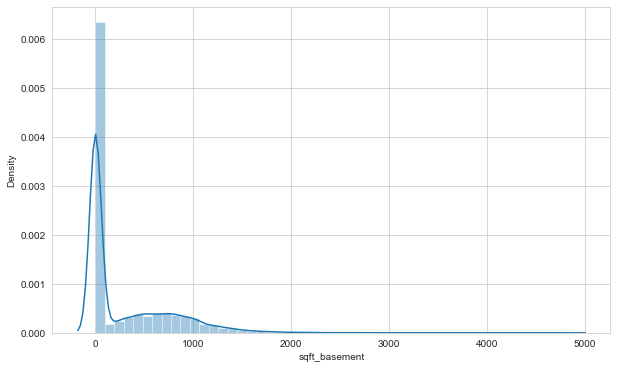

In [36]:
sns.distplot(df['sqft_basement']);

In [37]:
df['sqft_basement'].value_counts(dropna = False) # 0 olanlar bodrumu olmayanlar.

0      13110
600      221
700      218
500      214
800      206
       ...  
518        1
374        1
784        1
906        1
248        1
Name: sqft_basement, Length: 306, dtype: int64

In [38]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,1991,0,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,1980,0,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0


sqft_above + sqft_basement toplamı bize sqft_living veriyor.

could make sense due to scaling, higher should correlate to more value

### sqft_above

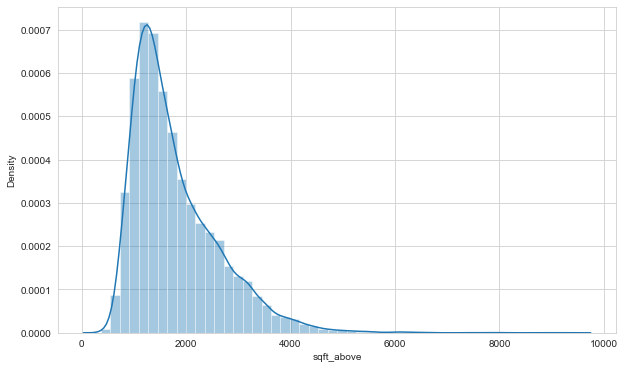

In [39]:
sns.distplot(df['sqft_above']);

In [40]:
df['sqft_above'].value_counts(dropna = False)

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
3674      1
2979      1
2382      1
6290      1
1425      1
Name: sqft_above, Length: 942, dtype: int64

In [41]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,2001,0,47.568,-122.189,4160,18969,0,0,0,0,0,0,1,0,0,0,0,0
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,1996,0,47.733,-122.362,2740,10761,1,0,0,0,0,0,0,0,0,0,0,0
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,2006,0,47.541,-121.982,6210,95832,1,0,0,0,0,0,0,0,0,0,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,2002,0,47.455,-121.764,5610,169549,1,0,0,0,0,0,0,0,0,0,0,0
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,1992,0,47.447,-122.086,3270,34500,0,0,0,0,0,0,1,0,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0


### Geographical Properties

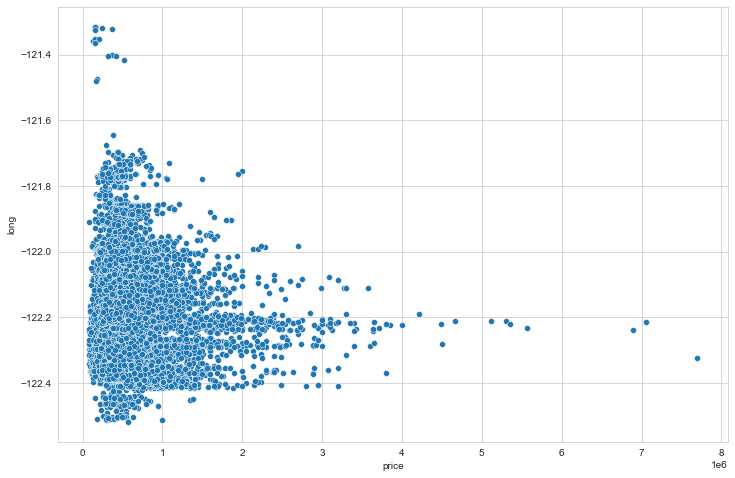

In [42]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

Görüldüğü gibi -122 boylamı civarında daha yüksek ev fiyatları var.

Enlem ile de 47.6-47.7 arasında ev fiyatlarının yüksek olduğunu görüyoruz.

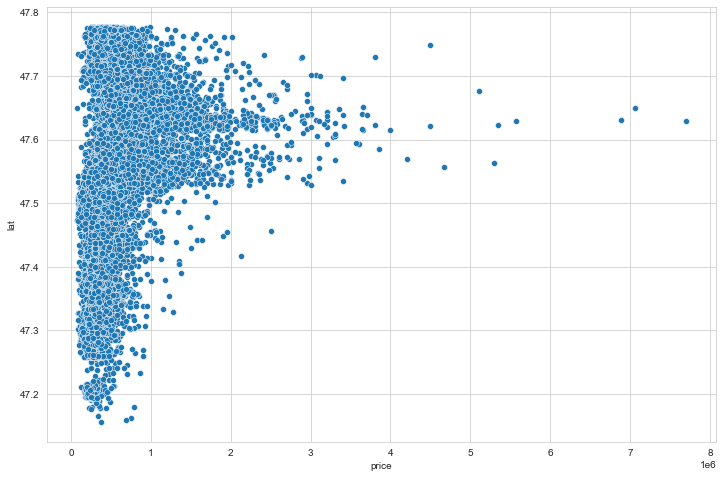

In [43]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

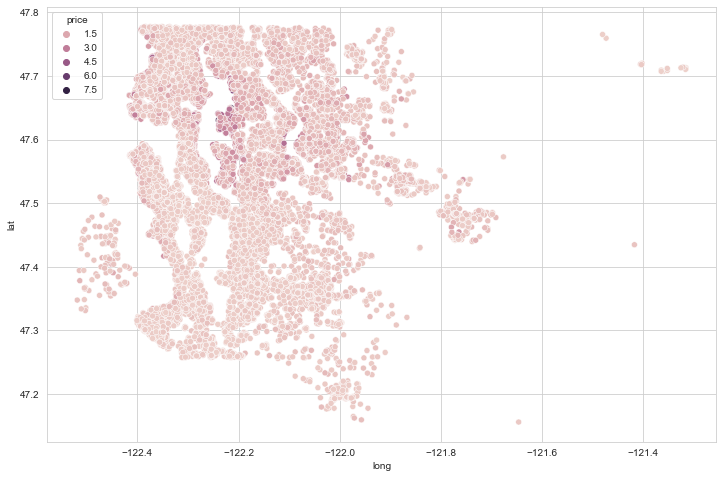

In [44]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

Datasetimde çok yüksek ev fiyatları olduğundan dolayı datamın %1 ne bakıyorum. En yüksek olan 216 gözlemi çıkararak tekrar bir görüntü almak istiyorum.

In [45]:
len(df) * (0.01)

215.96

In [46]:
df.sort_values('price', ascending = False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


Yaptığım sıralamaya göre price yüksek olan 216 dan sonrasını alarak yeni bir df atıyorum.

In [47]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]

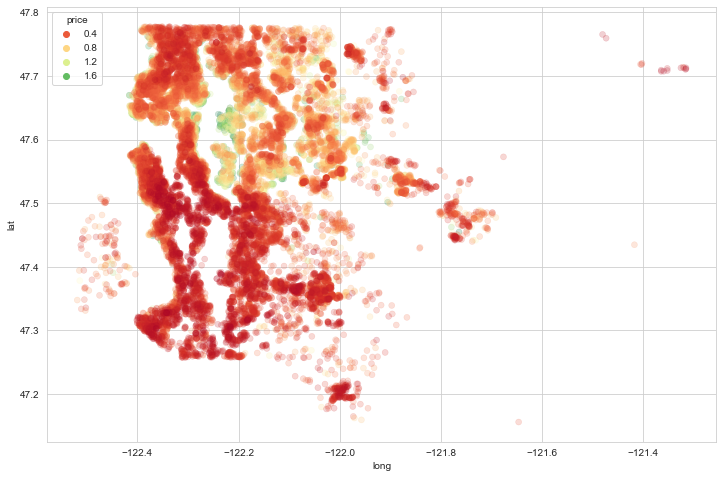

In [48]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

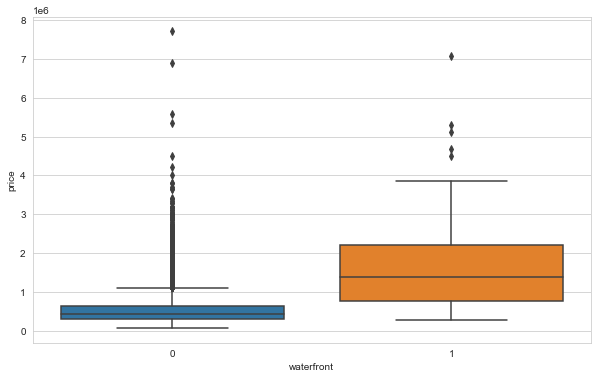

In [49]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

df deki lat ve long değerlerinin ortalamasını alarak bu haritayı elde ettim.

In [ ]:
import folium
import branca.colormap as cm

In [50]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

Aşağıda ise for döngüsü ile df deki lat ve long değerlerini teker teker gezerek her birini harita üzerine işliyoruz.

In [ ]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [51]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
colormap = cm.StepColormap(colors=["green","yellow","orange","red"] ,
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)
for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1, #yarıçap
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m

### latest data

In [52]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0


In [53]:
df.shape

(21596, 30)

## Preprocessing of Data
- Train | Test Split, Scalling

In [54]:
from sklearn.model_selection import train_test_split

In [55]:
X = df.drop('price', axis = 1)
y = df['price']

DL ilk olarak agırlıkları random olarak atıyor. Ve bundan dolayı çalıştırdığımızda her seferinde farklı scorelar alıyoruz. DL de ML den farklı olarak bu farkın daha yüksek olduğunu görüyoruz. Bunu engellemek için seed= 101 tanımladım ve bunu kullanıyorum.

Datamızı train, test ve validation olarak 3 e böleceğiz. Burada train ve test olarak böldük. İleride validation olarak da ayıracağız.

In [56]:
seed = 101

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed)

In [58]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [59]:
scaler = MinMaxScaler()

In [60]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

Bu structure oluşturmak için Sequential, layerlar için ise Dense ve Activation import ettik. Daha sonra değerlendirme metricleri import ettik. Ve bu şekilde structure hazır hale geldi.

Katmanlardaki nöron sayılarıni belirleme ile ilgili farklı yaklaşımlar var. Mesela input*2/3 ilk hidden layer vererek bunun azaltarak outputa kadar gelebiliriz gibi. 

Burada ise 29 tane input var. İlk hidden layerde 29, sonra yarıya düşürerek 15, 8 ve son olarak da output 1 olarak verdim.

In [61]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [62]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score

In [63]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [64]:
X_train.shape

(19436, 29)

Aşağıdaki gibi activation func. model içine değilde her bir layerdan sonra yazarsak o layerin activation func. olduğunu göstermiş olabiliriz.

Aşağıdaki gibi tf.random.set_seed(seed) model içinde belirtirsek her çalıştırdığımızda aynı ağırlıkları alırız yoksa aksi takdirde bize farklı ağırlıklar ve scorelar verir.

In [65]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu', input_dim = X_train.shape[1]))
#model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer.  
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

model.compile(optimizer = 'adam', loss = 'mse')

!!! önemli:

Eğer input_dim yukarıdaki gibi yazmasaydık bu durumda aşağıdaki model.weights kısmına ancak model fit ettikten sonra bakabilirdik. 

Bu şekilde yazarak fit etmeden önce bakabilme imkanımız oluyor. 

Yukarıdaki gibi yazmayıp bunu model fit ederken burada yazarsak model evet benim 29 tane inputumda nöron olduğu model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000) kısmında söyleyebiliyor.

In [66]:
model.weights

[<tf.Variable 'dense/kernel:0' shape=(29, 29) dtype=float32, numpy=
 array([[-1.70324743e-02, -1.51578441e-01, -3.13210070e-01,
         -1.69344082e-01, -2.32419372e-03,  1.83119476e-01,
          3.12089741e-01,  1.32420003e-01, -7.77235925e-02,
         -1.80055380e-01,  1.37490690e-01,  2.44639575e-01,
          2.31555283e-01, -6.62986040e-02, -2.74564326e-02,
         -1.35668695e-01,  2.61596382e-01,  8.22164118e-02,
          5.58787882e-02, -2.51106918e-01, -5.92915118e-02,
          2.22223699e-01,  2.98478782e-01, -2.02705756e-01,
         -7.43545145e-02,  4.26854789e-02,  1.53914899e-01,
          2.50992417e-01, -3.05378854e-01],
        [ 6.67949915e-02,  2.71055698e-01,  3.84545326e-02,
          9.87240672e-02,  4.28160727e-02,  3.17192078e-01,
          1.78963125e-01, -2.03873098e-01,  2.77073383e-02,
         -3.17017347e-01,  1.53067470e-01, -2.94106930e-01,
         -8.02034587e-02, -8.54518265e-02,  2.60613561e-01,
          8.22514594e-02,  3.08114409e-01, -1.64

!!! ÖNEMLİ:

Validation_split parametresi, önce yukarıda ayırdığımız test setinden farklı olarak train datamın yüzde olarak sondan % 15 alır ve bunu ayırır. Bunu train kısmına sokmaz. Artık bu datanın haricindeki kısmı her epoch başlangıçında dağıtır, batch_size kaç olarak belirtmişsem bunun sonucunda bana backpropagation yaparak hataların ortalamasını alarak geriye dönerek ağırlıkları tekrar günceller. 

Her batch sonucunda x_train ve y_train ile loss buluyor.

Her epoch sonucunda ise validation datası ile val_loss buluyor.

ML de nasıl train ve test scorelarını karşılaştırıyor ise burada da loss ve val_loss değerlerini karşılaştırıyor. DL de ise bunun her epoch sonucunda yapıyor.

Mesela aşağıdaki örnekte 130 kere iterasyon yapmış yani 130*128 tane gözlem durumu söz konusu. Her işlemde bir score alıyor ancak burada 130. sırada aldığı score gösteriyor bize. Görüldüğü gibi 1000 epoch ile de bunun 1000 kere yapmış oluyor.

TF yapmış olduğu tüm işlemleri seed ile sabitlemiş olduk.

In [68]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 0s 3ms/step - loss: 21422852096.0000 - val_loss: 25424271360.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 21394561024.0000 - val_loss: 25356572672.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 21369823232.0000 - val_loss: 25594810368.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 21350510592.0000 - val_loss: 25447327744.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 21295548416.0000 - val_loss: 25703327744.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 21282947072.0000 - val_loss: 25423601664.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 21239396352.0000 - val_loss: 25438189568.0000
Epoch 8/1000
130/130 [==============================] - 0s 1ms/step - loss: 21261731840.0000 - val_loss: 25461239808.0000
Epoch 9/1000
130/130 [==

130*1000 kere aşağıdaki parametreler güncellenmiş oldu.

In [69]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 29)                870       
                                                                 
 dense_1 (Dense)             (None, 29)                870       
                                                                 
 dense_2 (Dense)             (None, 15)                450       
                                                                 
 dense_3 (Dense)             (None, 8)                 128       
                                                                 
 dense_4 (Dense)             (None, 1)                 9         
                                                                 
Total params: 2,327
Trainable params: 2,327
Non-trainable params: 0
_________________________________________________________________


In [70]:
model.weights  # train sonrası oluşan ağırlık değerleridir.

[<tf.Variable 'dense/kernel:0' shape=(29, 29) dtype=float32, numpy=
 array([[-1.45900279e-01, -8.68959486e-01, -1.59829572e-01,
         -4.78031904e-01, -1.03518432e-02, -3.82688880e-01,
         -3.44933867e-01,  7.07079023e-02, -1.40441847e+00,
         -3.94830674e-01, -1.37532747e+00, -2.05130625e+00,
          1.30694106e-01, -3.81476969e-01,  6.72871709e-01,
         -1.48488688e+00, -1.19868934e+00, -7.75144696e-01,
         -2.58688301e-01, -8.81397724e-01, -3.97425115e-01,
         -3.21580827e-01, -5.64322472e-01,  1.65782130e+00,
         -4.39638406e-01,  5.42034566e-01,  3.04930061e-01,
          1.06932986e+00,  2.02738374e-01],
        [ 1.07895827e+00,  7.64366925e-01,  2.67390180e-02,
         -1.38380378e-01, -2.02451721e-01,  3.43386382e-01,
         -5.77001691e-01,  6.62566245e-01,  2.50921798e+00,
          7.25007117e-01,  1.82989657e+00, -9.71092343e-01,
         -1.78282961e-01,  1.59738827e+00,  1.57193446e+00,
          1.75458109e+00,  1.65868306e+00,  1.06

In [71]:
pd.DataFrame(model.history.history)

,loss,val_loss
0,21422852096.000,25424271360.000
1,21394561024.000,25356572672.000
2,21369823232.000,25594810368.000
3,21350510592.000,25447327744.000
4,21295548416.000,25703327744.000
...,...,...
995,12821720064.000,21792442368.000
996,12805549056.000,22323863552.000
997,12845200384.000,22041151488.000
998,12804244480.000,22004160512.000


<AxesSubplot:>

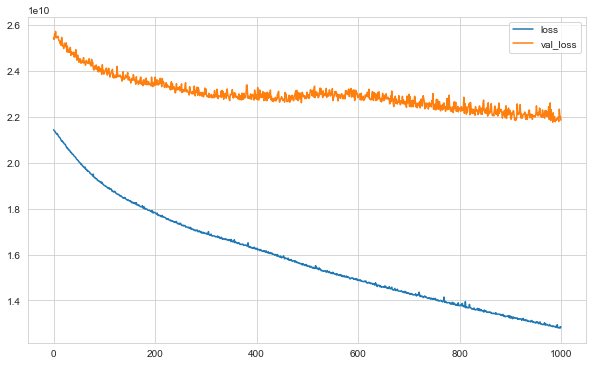

In [72]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

İstenilen durum train datası ile yapılan eğitim sonucu alınan loss ile validation datası ile yapılan eğitim sonucu alınan val_loss değerlerinin birbirine paralel olarak devam etmesidir.

In [73]:
model.evaluate(X_test, y_test, verbose=0)

15412074496.0

In [74]:
y_pred = model.predict(X_test) # X_test burada predict yaparken ilk defa devreye giriyor.

In [75]:
eval_metric(y_test, y_pred)

r2_score: 0.8800427717593778 
mae: 73396.37205041957 
mse: 15412076126.994926 
rmse: 124145.3830272996


### learning_rate

learning rate, global mean gitmek için ne kadar adım atmamız gerektiğini belirliyor. Türev alındıktan sonra elde edilen slope ile learning rate çarpınca çıkan score bize step_size veriyordu.

Amaç eğer overfitting yoksa modelimin daha hızlı öğrenmesini sağlamaktır. Bunu da learning rate ile yapıyoruz. 

opt = Adam(lr = 0.003) şeklinde gösteriyoruz. Burada default learning rate value is 0.001. İlk başta mesela 0.01 ile yani 10 kat artırarak başlayıp sonrasında 0.008, 0.005 ve 0.003 denedik. Modelimin overfitting gidip gitmediğine ve en iyi score nerede aldığıma bakıyorum. 

In [76]:
from tensorflow.keras.optimizers import Adam

In [77]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003) # default learning rate value is 0.001
model.compile(optimizer = opt, loss = 'mse')

In [78]:
model.weights

[<tf.Variable 'dense_5/kernel:0' shape=(29, 29) dtype=float32, numpy=
 array([[-1.70324743e-02, -1.51578441e-01, -3.13210070e-01,
         -1.69344082e-01, -2.32419372e-03,  1.83119476e-01,
          3.12089741e-01,  1.32420003e-01, -7.77235925e-02,
         -1.80055380e-01,  1.37490690e-01,  2.44639575e-01,
          2.31555283e-01, -6.62986040e-02, -2.74564326e-02,
         -1.35668695e-01,  2.61596382e-01,  8.22164118e-02,
          5.58787882e-02, -2.51106918e-01, -5.92915118e-02,
          2.22223699e-01,  2.98478782e-01, -2.02705756e-01,
         -7.43545145e-02,  4.26854789e-02,  1.53914899e-01,
          2.50992417e-01, -3.05378854e-01],
        [ 6.67949915e-02,  2.71055698e-01,  3.84545326e-02,
          9.87240672e-02,  4.28160727e-02,  3.17192078e-01,
          1.78963125e-01, -2.03873098e-01,  2.77073383e-02,
         -3.17017347e-01,  1.53067470e-01, -2.94106930e-01,
         -8.02034587e-02, -8.54518265e-02,  2.60613561e-01,
          8.22514594e-02,  3.08114409e-01, -1.

In [79]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 2ms/step - loss: 428062801920.0000 - val_loss: 419663216640.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 348343828480.0000 - val_loss: 181425520640.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 108675309568.0000 - val_loss: 103254401024.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 93860651008.0000 - val_loss: 99181690880.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 89556877312.0000 - val_loss: 94929666048.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 84964990976.0000 - val_loss: 90089545728.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 80082558976.0000 - val_loss: 85358977024.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 74900635648.0000 - val_loss: 79852060672.0000
Epoch 9/1000
130/1

<AxesSubplot:>

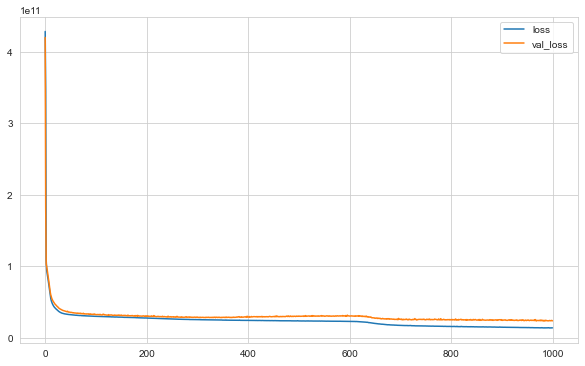

In [80]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

Mesela yukarıdaki grafikte 600 civarında yeni local mean girdiğini gördük. 

Aldığımız scoreların daha da iyileştiğini ve daha kısa sürede modelimin eğitildiğini görebiliyoruz.

In [81]:
y_pred = model.predict(X_test)

In [82]:
eval_metric(y_test, y_pred)

r2_score: 0.8680974651406356 
mae: 76350.2115379051 
mse: 16946806277.637138 
rmse: 130179.89966825576


### EarlyStopping

Early Stopping ise datamın artık daha fazla eğitilmesi durumu söz konusu değilse modeli durdurma işlemidir ve zamandan tasarruf sağlar.

Early stop diye bir parametre tanımlayıp içine monitor ile neyi gözlemlediğimizi, patience ile de kaç satır yani iterasyon boyunca score iyileşmezse eğitimi durdur demektir.

Mesela class problemlerinde bunun içine accuracy,recall değerini verdiğimizde benim için max değer daha iyi olacağından dolayı mode auto değilde bu sefer max olarak vermemiz gerekecek. Ama auto da bırakırsak max, min olduğunu anlar ve ona göre bakar.

In [83]:
from tensorflow.keras.callbacks import EarlyStopping

In [84]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [85]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [86]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 428062801920.0000 - val_loss: 419663216640.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 348343828480.0000 - val_loss: 181425520640.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 108675309568.0000 - val_loss: 103254401024.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 93860651008.0000 - val_loss: 99181690880.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 89556877312.0000 - val_loss: 94929666048.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 84964990976.0000 - val_loss: 90089545728.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 80082558976.0000 - val_loss: 85358977024.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 74900635648.0000 - val_loss: 79852060672.0000
Epoch 9/1000
130/1

<AxesSubplot:>

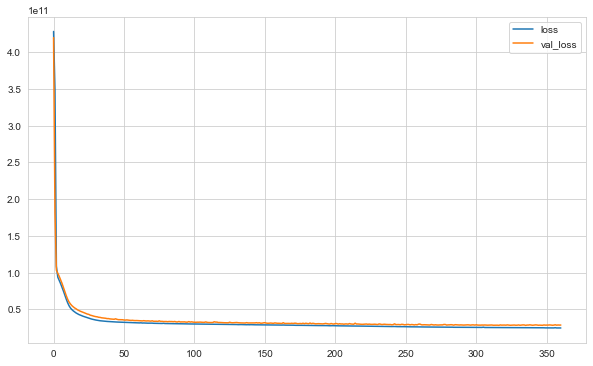

In [87]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [88]:
y_pred = model.predict(X_test)

In [89]:
eval_metric(y_test, y_pred)

r2_score: 0.8223527221703715 
mae: 94451.01079282408 
mse: 22824079964.332554 
rmse: 151076.4043930506


Early stop kullanınca patience 25 verdiğimizde bulduğu min noktada takılıp kaldı ve buradan çıkamadı. Bundan dolayı aldığımız scorelar daha düşük çıktı. Belki bunu daha yüksek almış olsaydık bu durumda scorelarımız daha yüksek gelebilirdi. 

Bir overfitting durumu söz konusu olmadığından dolayı early stop burada ihtiyaç yoktu.

### Dropout

!!! önemli:

Dropout, overfitting engellemek için kullanılır. Model, çok fazla öğreniyor ve ezber yapıyor. Her seferinde farklı bir yeri kapatarak aynı veriyi görmemesini yani ezber yapmasını engellemeye çalışıyorum.

Bunu her layer koymak zorunda değiliz. Bunu istediğimiz layerlara koyabiliriz. Burada overfitting olmadığından dolayı bunu burada net olarak göremiyoruz. Ancak regression probleminde daha iyi görebileceğiz.

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [90]:
from tensorflow.keras.layers import Dropout

In [91]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dropout(0.2))
model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(15, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(8, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [92]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [93]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 427572002816.0000 - val_loss: 414624251904.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 272045604864.0000 - val_loss: 106626056192.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 127681044480.0000 - val_loss: 101564825600.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 115980656640.0000 - val_loss: 94682431488.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 111958179840.0000 - val_loss: 88348639232.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 105106890752.0000 - val_loss: 82633883648.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 98024972288.0000 - val_loss: 74033315840.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 89550897152.0000 - val_loss: 67734417408.0000
Epoch 9/1000
13

<AxesSubplot:>

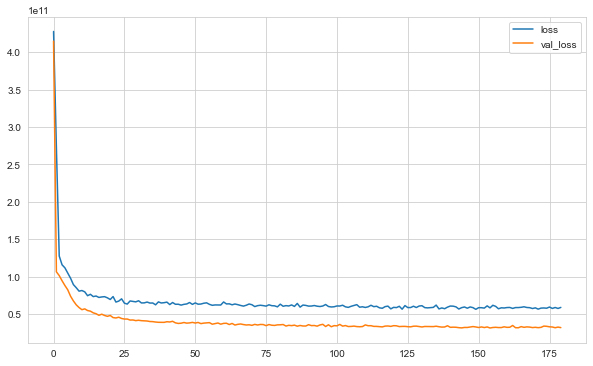

In [94]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [95]:
y_pred = model.predict(X_test)

In [96]:
eval_metric(y_test, y_pred)

r2_score: 0.7904575014815927 
mae: 101831.87234519675 
mse: 26921970325.359562 
rmse: 164079.1587172471


## Saving Final Model and Scaler

In [97]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [98]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu', input_dim = X_train.shape[1]))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [ ]:
#early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

!!! ÇOK ÖNEMLİ:

Aşağıdaki dikkat edilmesi gereken husus ise validation_split ile validation_data olarak iki tane ayrı parametre söz konusu. Buna dikkat edelim. 

Burada daha fazla data ile train yapmış ve daha önce ayırdığımız test datasi ile de test işlemi yapıyoruz.

Early stop daha düşük score aldığımızdan dolayı burada çalıştırmadık.

In [99]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000,
         # callbacks = [early_stop]
         )

Epoch 1/1000
152/152 [==============================] - 1s 2ms/step - loss: 426416144384.0000 - val_loss: 406002565120.0000
Epoch 2/1000
152/152 [==============================] - 0s 1ms/step - loss: 274798018560.0000 - val_loss: 94608293888.0000
Epoch 3/1000
152/152 [==============================] - 0s 1ms/step - loss: 97477058560.0000 - val_loss: 88555741184.0000
Epoch 4/1000
152/152 [==============================] - 0s 1ms/step - loss: 92657041408.0000 - val_loss: 83812974592.0000
Epoch 5/1000
152/152 [==============================] - 0s 2ms/step - loss: 87678459904.0000 - val_loss: 78632173568.0000
Epoch 6/1000
152/152 [==============================] - 0s 1ms/step - loss: 82362630144.0000 - val_loss: 73219350528.0000
Epoch 7/1000
152/152 [==============================] - 0s 1ms/step - loss: 76469280768.0000 - val_loss: 67131916288.0000
Epoch 8/1000
152/152 [==============================] - 0s 1ms/step - loss: 70028427264.0000 - val_loss: 60857552896.0000
Epoch 9/1000
152/152 

<AxesSubplot:>

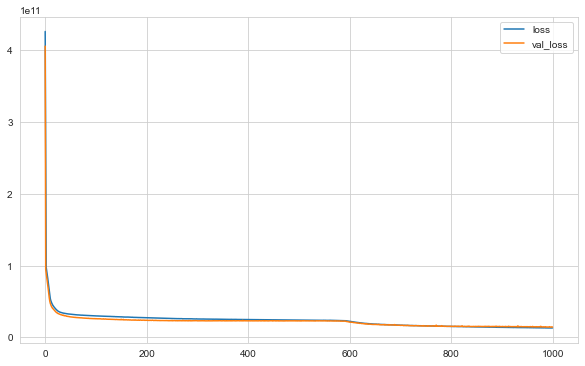

In [100]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

600 den sonra bir min yakalamış ve daha iyi bir score aldık.

Environment farklı olduğundan dolayı seed olayını sabitlesek bile bu durumda farklı sonuçlar alabiliriz.

In [101]:
y_pred = model.predict(X_test)

In [102]:
eval_metric(y_test, y_pred)

r2_score: 0.8895998370206212 
mae: 72695.02824797454 
mse: 14184186657.412619 
rmse: 119097.38308381347


In [105]:
model.save('model_kc_house.h5')  # creates a HDF5 file 'my_model.h5'

## Loading Model and Scaler

In [107]:
from tensorflow.keras.models import load_model

In [108]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [113]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0


In [114]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21760797,
        0.15304348, 0.00573322, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 1.        , 0.        , 0.        ]])

In [115]:
model_kc_house.predict(single_house)

array([[263670.9]], dtype=float32)

In [116]:
df.iloc[0][0]

221900.0

## Comparison with ML

### Linear Regression

In [117]:
from sklearn.linear_model import LinearRegression 

In [118]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7168439905813015 
mae: 122192.94755096179 
mse: 36379816681.18641 
rmse: 190734.93828133956


### Random Forest

In [119]:
from sklearn.ensemble import RandomForestRegressor

In [120]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.8886293030442941 
mae: 64785.36375462963 
mse: 14308880631.643038 
rmse: 119619.73345415479


!!! ÖNEMLİ:

Görüldüğü gibi ML modellerinden de yakın scorelar aldık. 

Ancak DL"nin farkı büyük data setlerinde ortaya çıkar. Daha büyük datalarda daha fazla tekrar ile daha iyi scorelar alıyoruz. Burada tekrar çok önemli. Aynı datayı defalarca tekrarlamış oluyoruz. 

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___